### Notebook 3_5

## Discrete-Time System — Input and Output

#### Student Learning Outcomes

* Learn the notation of discrete-time signals
* Learn the sampling before the input of discrete-time system (ADC)
* Learn the signal recounstruction after the output of discrete-time system (DAC)
--------------------

In [1]:
# import at first
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as sig

<div style="border-left: 4px solid #28a745; padding: 10px; background-color: #f9fff3; margin-top: 10px;">
  <h2 style="margin: 0;">Task 1: System Overview</h2>
</div>


We may process real-world signals using digital devices like microcontrollers, digital signal processors (DSPs). These devices cannot handle continuous-time signals directly — they require a discrete-time version.

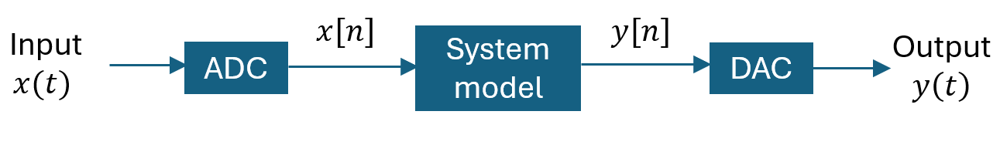

A typical process is 

1. **$ x(t) \longrightarrow x[n] $**  

    The analog signal $x(t)$ is **sampled** by an **Analog-to-Digital Converter (ADC)** to create a discrete-time signal $x[n]$.

2. **$x[n] \longrightarrow y[n]$**

    The sampled input $x[n]$ is processed by a **Discrete-Time System** to produce an output $y[n]$.

3. **$y[n] \longrightarrow y(t)$**  

    The system output $y[n]$ is passed thru a **Digital-to-Analog Converter (DAC)** to reconstruct the **analog signal** $y(t)$.


----------
The next code cell gives a very simple example of the entire process.

Run it. Everything is coded.

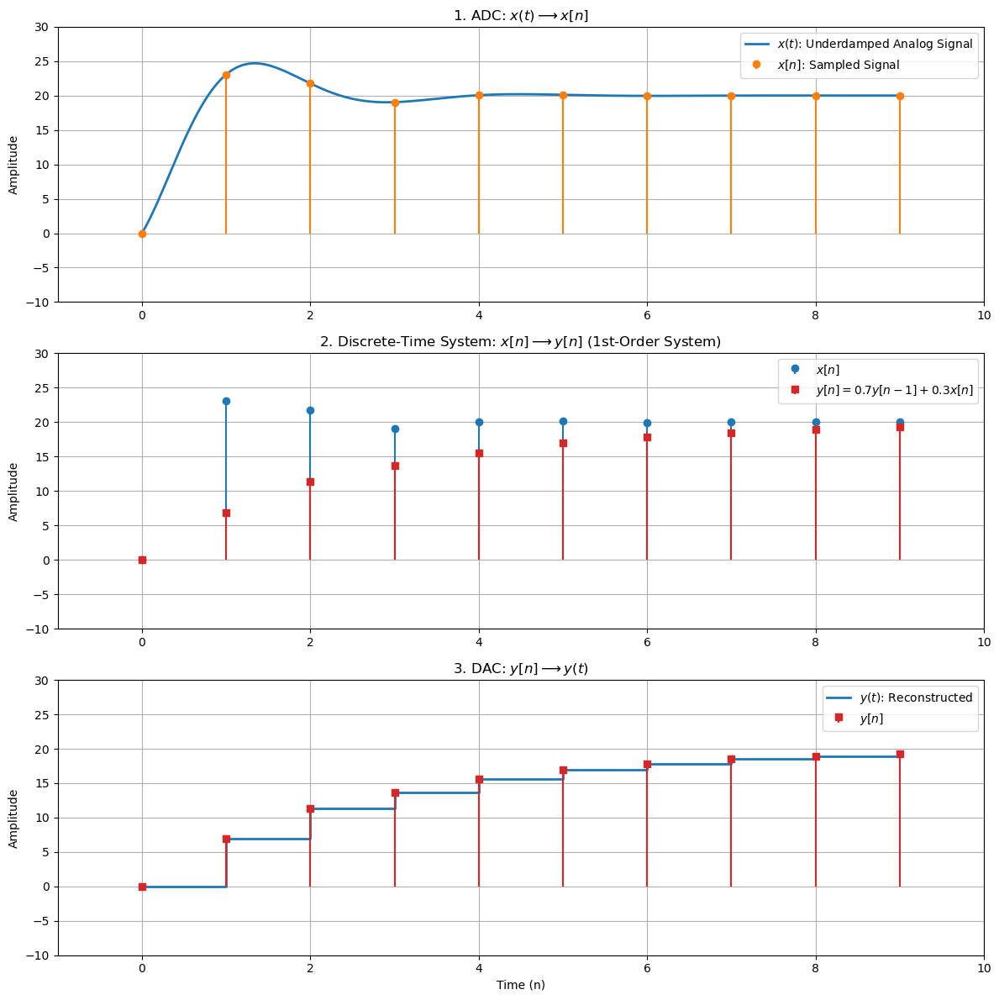

In [2]:
# ----------------------------------------
# 1. Define Analog Input
# ----------------------------------------
t_cont = np.linspace(0, 9, 1000)
x_t = 20 * (1 - np.exp(-1 * t_cont) * np.cos(2*t_cont))  # analog signal

# Sample the analog input
n = np.arange(0, 10)  # sampling period 1
T = 1
x_n = 20 * (1 - np.exp(-1 * n*T) * np.cos(2 * n*T))  # sampled signal

# ----------------------------------------
# 2. Define Discre-Time System
# ----------------------------------------
y_n = np.zeros_like(x_n)
for i in range(1, len(x_n)):
    y_n[i] = 0.7 * y_n[i - 1] + 0.3 * x_n[i]

# ----------------------------------------
# 3. Reconstruction of y[n]
# ----------------------------------------
t_zoh = np.repeat(n, 2)[1:]
y_t = np.repeat(y_n, 2)[:-1]

# ----------------------------------------
# 4. Plot
# ----------------------------------------
plt.figure(figsize=(12, 12))
plt.subplot(3, 1, 1)
plt.plot(t_cont, x_t, 'C0-', lw=2, label=r'$x(t)$: Underdamped Analog Signal')
plt.stem(n, x_n, linefmt='C1-', markerfmt='C1o', basefmt=" ", label=r'$x[n]$: Sampled Signal')
plt.ylabel("Amplitude")
plt.title("1. ADC: $x(t) \\longrightarrow x[n]$")
plt.legend()
plt.xlim(-1, 10)
plt.ylim(-10, 30)
plt.grid(True)

plt.subplot(3, 1, 2)
plt.stem(n, x_n, linefmt='C0-', markerfmt='C0o', basefmt=" ", label=r'$x[n]$')
plt.stem(n, y_n, linefmt='C3-', markerfmt='C3s', basefmt=" ", label=r'$y[n] = 0.7 y[n-1] + 0.3 x[n]$')
plt.ylabel("Amplitude")
plt.title("2. Discrete-Time System: $x[n] \\longrightarrow y[n]$ (1st-Order System)")
plt.legend()
plt.xlim(-1, 10)
plt.ylim(-10, 30)
plt.grid(True)

plt.subplot(3, 1, 3)
plt.plot(t_zoh, y_t, drawstyle='steps-post', lw=2, label=r'$y(t)$: Reconstructed')
plt.stem(n, y_n, linefmt='C3-', markerfmt='C3s', basefmt=" ", label=r'$y[n]$')
plt.xlabel("Time (n)")
plt.ylabel("Amplitude")
plt.title("3. DAC: $y[n] \\longrightarrow y(t)$")
plt.legend()
plt.xlim(-1, 10)
plt.ylim(-10, 30)
plt.grid(True)

plt.tight_layout()

Based on the code cell above, answer the following in **Markdown**:

1. **Type the mathematical expression** for the analog signal $x(t)$  
2. **List the 6 numerical values** of these sampled input signal $x[n]$ as $x[0] = ??,\ x[1] = ??,\ x[2] = ??,\ x[3] = ??,\ x[4] = ??,\ x[5] = ??$ 

    (You can round some decimal places)

3. **Type the mathematical expression** for the discrete-time system. (It is a difference equation)
4. **List the 6 numerical values** of the output signal $y[n]$ computed by the discrete-time system $y[0] = ??,\ y[1] = ??,\ y[2] = ??,\ y[3] = ??\ y[4] = ??\ y[5] = ??$ 

    (You can round some decimal places)

You can print out variables from code to check.

In [4]:
# Check with Python
print('x[n]: ', x_n)
print('y[n]: ', y_n)

x[n]:  [ 0.         23.06183731 21.76922089 19.04391873 20.05329852 20.11307239
 19.9581659  19.99750624 20.00642518 19.99837021]
y[n]:  [ 0.          6.91855119 11.3737521  13.67480209 15.58835102 16.94576743
 17.84948697 18.49389275 18.94765248 19.2628678 ]


**Answer**

1. Analog signal $x(t)$

$$x(t) = 20\times (1 - e^{-t}\cos (2t))$$  

2. Sampled input signal $x[n]$

$$x[0] = 0,\ x[1] = 23.06,\ x[2] = 21.77,\ x[3] = 19.04,\ x[4] = 20.05,\ x[5] = 20.11$$

3. discrete-time system 

$$y[n] = 0.7 y[n-1] + 0.3 x[n]$$

4. Output signal $y[n]$

$$y[0] = 0,\ y[1] = 6.92,\ y[2] = 11.37,\ y[3] = 13.67\ y[4] = 15.59\ y[5] = 16.95$$

<span style="border-left: 4px solid #FFA500; padding: 5px; background-color: #FFF4E5; display: inline-block;">
    <strong>Markdown Answer: 1.5 pt</strong>
</span>

**Check $x(t) \longrightarrow x[n]$**

The ADC sampling period $T$ is 1 second. From your answered $x(t)$, calculate the numberical values:
* $x(1\, T)$
* $x(2\, T)$
* $x(3\, T)$

Do they match $x[1]$, $x[2]$, $x[3]$, respectively?

(You can use Python code cell to calculate and printout)

**Check $x[n] \longrightarrow y[n]$**

From your answered $x[n]$ and $y[n]$, calculate the numerical values:
* $0.7 y[0] + 0.3 x[1]$
* $0.7 y[1] + 0.3 x[2]$
* $0.7 y[2] + 0.3 x[3]$

Do they match $y[1]$, $y[2]$, $y[3]$, respectively?

(You can use Python code cell to calculate and printout)

-----
**Answer**

In [5]:
# Check with Python
print('x[1 T]: ', 20 * (1 - np.exp(-1 * 1) * np.cos(2*1)))
print('x[2 T]: ', 20 * (1 - np.exp(-1 * 2) * np.cos(2*2)))
print('x[3 T]: ', 20 * (1 - np.exp(-1 * 3) * np.cos(2*3)))


x[1 T]:  23.061837313484528
x[2 T]:  21.76922089130764
x[3 T]:  19.04391872587493


* $x(1\, T) = 23.06$
* $x(2\, T) = 21.77$
* $x(3\, T) = 19.04$

Yes. They do match.

In [7]:
# Check with Python
print('0.7y[0] + 0.3x[1]: ', 0.7*0 + 0.3*23.06)
print('0.7y[1] + 0.3x[2]: ', 0.7*6.92 + 0.3*21.77)
print('0.7y[2] + 0.3x[3]: ', 0.7*11.37 + 0.3*19.04)


0.7y[0] + 0.3x[1]:  6.917999999999999
0.7y[1] + 0.3x[2]:  11.375
0.7y[2] + 0.3x[3]:  13.671


* $0.7 y[0] + 0.3 x[1] = 6.92$
* $0.7 y[1] + 0.3 x[2] = 11.375$
* $0.7 y[2] + 0.3 x[3] = 13.671$

Yes. They do match.

<span style="border-left: 4px solid #FFA500; padding: 5px; background-color: #FFF4E5; display: inline-block;">
    <strong>Answer: 1.5 pt</strong>
</span>

<div style="border-left: 4px solid #28a745; padding: 10px; background-color: #f9fff3; margin-top: 10px;">
  <h2 style="margin: 0;">Task 2: DAC</h2>
</div>


Let us dive deep into the process. We will first understand how we can reconstruct a continuous signal from a discrete-time sequence. This process is called Digital-to-Analog Conversion (DAC).

A discrete-time signal $y[n]$ is only defined at integer values of $n$, but we want to recreate a continuous signal $y(t)$ from it.

One common method for reconstruction is Zero-Order Hold (ZOH):

* It holds each sample value $y[n]$ constant for one sampling period $T$.

The DAC in Task 1 is ZOH.

Another choice can be First-Order Hold (FOH):

* It linearly connects each pair of samples $y[n]$ and $y[n+1]$ to form a piecewise linear analog signal.

-----
The following code shows you how such discrete-time signal is re-construcred to analog with a sampling period $T=0.1$ seconds.

$$y[0]=0,\, y[1]=1.2,\, y[2]=0.6,\, y[3]=-0.4,\, y[4]=1$$

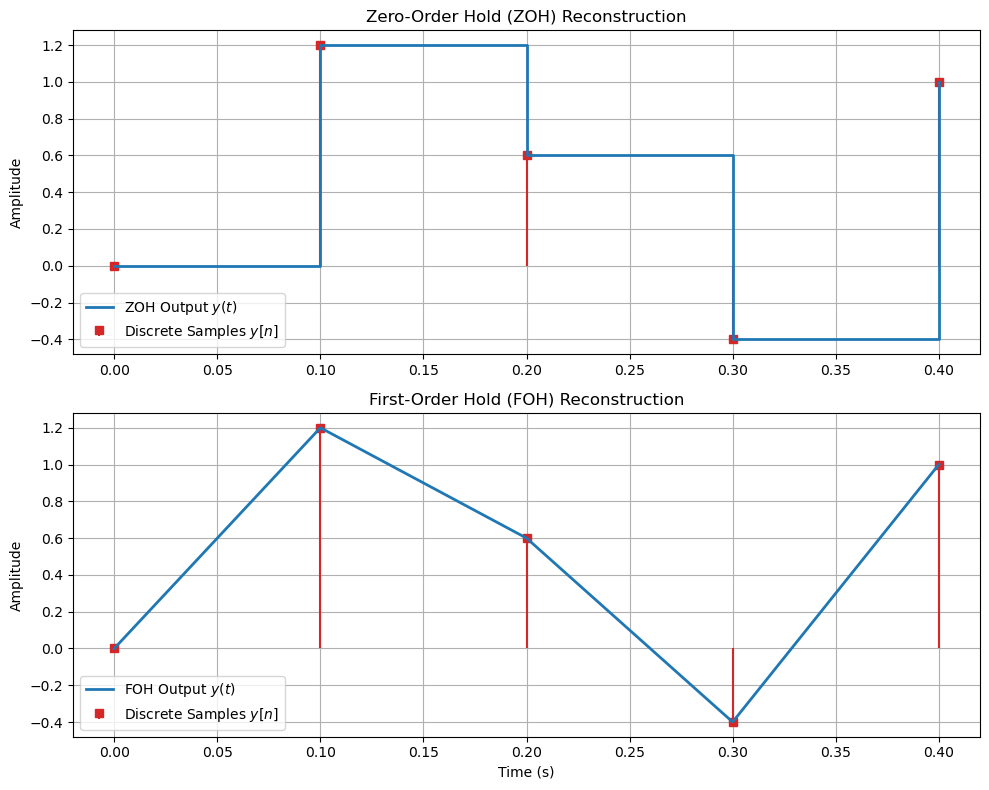

In [8]:
n = np.array([0, 1, 2, 3, 4])                
Ts = 0.1
y_n = np.array([0, 1.2, 0.6, -0.4, 1])      
t_analog = n * Ts

# ZOH Reconstruction
t_zoh = np.repeat(t_analog, 2)[1:]
y_zoh = np.repeat(y_n, 2)[:-1]

# FOH Reconstruction
t_foh = np.linspace(t_analog[0], t_analog[-1], 1000)
y_foh = np.interp(t_foh, t_analog, y_n)

plt.figure(figsize=(10, 8))

# --- Plot 1: ZOH ---
plt.subplot(2, 1, 1)
plt.stem(t_analog, y_n, linefmt='C3-', markerfmt='C3s', basefmt=' ', label='Discrete Samples $y[n]$')
plt.plot(t_zoh, y_zoh, drawstyle='steps-post', lw=2, color='tab:blue', label='ZOH Output $y(t)$')
plt.title("Zero-Order Hold (ZOH) Reconstruction")
plt.ylabel("Amplitude")
plt.grid(True)
plt.legend()

# --- Plot 2: FOH ---
plt.subplot(2, 1, 2)
plt.stem(t_analog, y_n, linefmt='C3-', markerfmt='C3s', basefmt=' ', label='Discrete Samples $y[n]$')
plt.plot(t_foh, y_foh, lw=2, color='tab:blue', label='FOH Output $y(t)$')
plt.title("First-Order Hold (FOH) Reconstruction")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.legend()

plt.tight_layout()

---------
**Causal System**

The **ZOH** is **Applicable** in real-time systems.

In fact, the **ideal FOH** is **Not Applicable** in real-time systems. It can only be used be in where all samples are already available. For example, offline simulations, post-processing.

This is because **ideal FOH** requires the datapoint $y[n+1]$ to calculate the interpolation slope. But $y[n+1]$ is the next time step — is a future data— it is impossible to get in real-time systems.

In practice, people will implement FOH with delayed output, instead of ideal FOH. https://en.wikipedia.org/wiki/First-order_hold#Delayed_first-order_hold

----------
Formally, we call such thing **Causality** in discrete-time systems:

> A **causal system** is one in which the output $y[n]$, **depends only on the present and past inputs and outputs** — not the future.

A system is **causal** if:
$$
y[n] \text{ depends only on } x[k] \text{ and/or } y[k], \text{ for } k \leq n
$$

A system is **non-causal** if:
$$
y[n] \text{ depends on any } x[k] \text{ or } y[k], \text{ where } k > n
$$


Simply saying, If you see a term like $x[n+1]$, $x[n+2]$, $y[n+1]$, etc., the system is non-causal.

-------------
Now it is your job to answer.

For each of the following discrete-time systems expressed by difference equations, determine whether it is causal or non-causal.
#### **1.**   
$y[n] = 0.6y[n-1] + 0.2x[n]$

#### **2.**   
$y[n] = x[n+1] - x[n-1]$

#### **3.**   
$y[n] = x[n] + 0.3x[n-1] + 0.3x[n-2]$

**Answer**

**1.**  Causal

**2.**   Non-Causal

**3.**   Causal


<span style="border-left: 4px solid #FFA500; padding: 5px; background-color: #FFF4E5; display: inline-block;">
    <strong>Causality: 1 pt</strong>
</span>

<div style="border-left: 4px solid #28a745; padding: 10px; background-color: #f9fff3; margin-top: 10px;">
  <h2 style="margin: 0;">Task 3: ADC</h2>
</div>


Let us look at another part of the process -- Analog-to-Digital Converter (ADC).

The ADC performs two main steps:
1. **Sampling (Time Discretization):**  
   Measure the signal value at uniform time intervals:
   $$
   x[n] = x(nT_s)
   $$
   where $T_s$ is the **Sampling Period**, and $ f_s = \frac{1}{T_s}$ is the **Sampling Rate (Sampling Frequency)** (Hz).

2. **Quantization (Amplitude Discretization):**  
   Round the continuous amplitude values to a fixed number of levels depending on the **bit resolution** (e.g., 8-bit, 12-bit).

We will discuss them one by one.

### 1. Sampling (Time Discretization):
Setting a proper sampling rate is crucial.

A lower sampling rate may:
* Miss important details in the signal 
* Cause aliasing, where high-frequency components appear as false low-frequency signals

------
The next code cell gives you such example:
* Analog Signal is a sine signal at 50 Hz
* The ADC sampling rate can by varied by moving the bar
* The discrete-time system is just $y[n] = x[n]$
* The DAC is FOH 

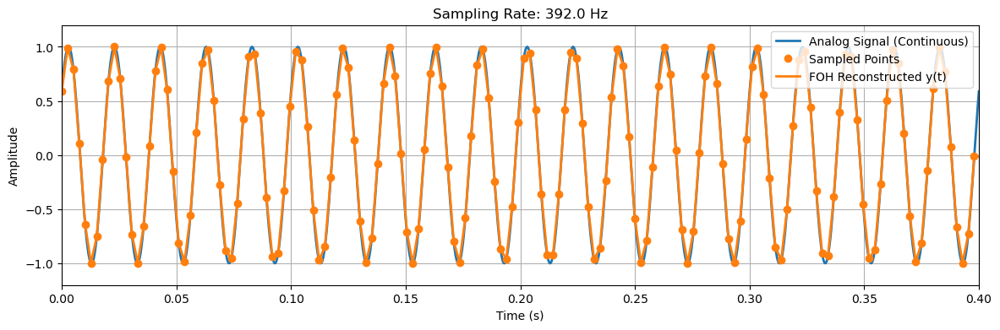

In [11]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# 1. Original analog signal
freq_signal = 50  # Hz
duration = 0.4    # seconds
t_fine = np.linspace(0, duration, 1000)
x_cont = np.sin(2 * np.pi * freq_signal * t_fine + np.pi / 5)

# 2. Sampling frequencies to sweep
fs_values = np.arange(20, 396, 4)  # Hz

# 3. Setup the plot
fig, ax = plt.subplots(figsize=(14, 4))
line_cont, = ax.plot(t_fine, x_cont, label='Analog Signal (Continuous)', lw=2)
marker_sampled, = ax.plot([], [], 'o', color='tab:orange', label='Sampled Points')
line_foh, = ax.plot([], [], lw=2, color='tab:orange', label='FOH Reconstructed y(t)')

ax.set_xlim([0, duration])
ax.set_ylim([-1.2, 1.2])
ax.set_xlabel("Time (s)")
ax.set_ylabel("Amplitude")
title_text = ax.set_title("")
ax.legend(loc='upper right')
ax.grid(True)

# 4. Init function
def init():
    marker_sampled.set_data([], [])
    line_foh.set_data([], [])
    title_text.set_text("")
    return line_cont, marker_sampled, line_foh, title_text

# 5. Frame update
def update(frame):
    fs = fs_values[frame]
    Ts = 1 / fs
    n = np.arange(0, duration, Ts)
    x_n = np.sin(2 * np.pi * freq_signal * n + np.pi / 5)

    # FOH: linear interpolation using np.interp
    t_interp = np.linspace(0, duration, 1000)
    y_foh = np.interp(t_interp, n, x_n)

    marker_sampled.set_data(n, x_n)
    line_foh.set_data(t_interp, y_foh)
    title_text.set_text(f"Sampling Rate: {fs:.1f} Hz")
    return line_cont, marker_sampled, line_foh, title_text

# 6. Build animation
anim = FuncAnimation(
    fig, update, frames=len(fs_values), init_func=init,
    interval=200, blit=True
)

# 7. Display in Jupyter Notebook
HTML(anim.to_jshtml())

Observe how the graph changes at different sampling frequencies. At certain frequencies, you may notice something unusual — the sampled points appear to form a new sine wave at a much lower frequency. This phenomenon is known as **Aliasing in signal sampling.**

Answer:
* What is the freq of sampled points when Sampling Rate is 44 Hz
* What is the freq of sampled points when Sampling Rate is 48 Hz
* What is the freq of sampled points when Sampling Rate is 52 Hz
* What is the freq of sampled points when Sampling Rate is 56 Hz

**Answer**

* When Sampling Rate is 44 Hz:

    Period is about 0.16 second. So freq is about 6.25 Hz
* When Sampling Rate is 48 Hz

    Period is about 0.5 second. So freq is about 2 Hz
* When Sampling Rate is 52 Hz

    Period is about 0.5 second. So freq is about 2 Hz
* When Sampling Rate is 56 Hz

    Period is about 0.16 second. So freq is about 6.25 Hz

<span style="border-left: 4px solid #FFA500; padding: 5px; background-color: #FFF4E5; display: inline-block;">
    <strong>Answer: 1 pt</strong>
</span>

--------
Formally, this is known as **Sampling Theorem**. It can be interpreted in 2 ways.

* If the input signal $x(t)$ is at freq $f_{\text{in}}$, and you are allowed to choose the sampling rate of ADC $f_s$ Hz, then perfect reconstruction of the signal from its samples is **only if**  
$$f_s > 2f_{\text{in}}$$

This critical rate $2f_{\text{in}}$ is called the **Nyquist rate**. The Nyquist rate is a property of the signal.

* Alternatively, if the sampling rate $f_s$ if your ADC is fixed, then only input signal $x(t)$ with such freq $f_{\text{in}}$
$$f_{\text{in}} < \frac{f_s}{2}$$
can be accurately reconstructed. If not, they will fold back into lower frequencies — **aliasing**.

### 2. Quantization (Amplitude Discretization):

Suppose
* Signal is already sampled in time.
* Each sample has a real-valued amplitude (e.g., voltage like 2.374 V).
* Quantization maps it to the nearest allowed level.

The number of levels depends on the bit resolution $B$ of the ADC.

$$\text{Number of levels} = 2^B$$

For example, many microcontrollers nowadays use a voltage range of 0-3.3V. Then it will map in such way:

| Bit Resolution | Levels | Voltage Step Size (Δ)             |
|----------------|--------|----------------------------------|
| 8-bit          | 256    | $\frac{3.3\,V}{255} \approx 12.94\,\text{mV} $ |
| 10-bit         | 1024   | $\frac{3.3\,V}{1023} \approx 3.22\,\text{mV} $ |
| 12-bit         | 4096   | $\frac{3.3\,V}{4095} \approx 0.81\,\text{mV} $ |


<div style="border-left: 4px solid #28a745; padding: 10px; background-color: #f9fff3; margin-top: 10px;">
  <h2 style="margin: 0;">Submit in .pdf</h2>
</div>


